In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sb
sb.set(style="whitegrid", color_codes=True)
from matplotlib import style
style.use('ggplot')
from sklearn import preprocessing


In [2]:
df=pd.read_csv('aspiring_minds_employability_outcomes_2015.csv',index_col=0)

### INTRODUCTION TO DATASET:--

The dataset was released by Aspiring Minds from the Aspiring Mind Employment Outcome 2015 (AMEO). The study is primarily limited  only to students with engineering disciplines.

The dataset contains the employment outcomes of engineering graduates as dependent variables (Salary, Job Titles, and Job Locations) along with the standardized scores from three different areas – cognitive skills, technical skills and personality skills. The dataset also contains demographic features. The dataset  contains  around  40 independent variables and 4000 data points. The independent variables are both continuous and categorical in nature.

The dataset contains a unique identifier for each candidate. Below mentioned table contains the details for the original dataset. 

In [3]:
df.head()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
train,203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,f,19-02-1990 00:00,84.3,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
train,579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,m,04-10-1989 00:00,85.4,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
train,810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,f,03-08-1992 00:00,85.0,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
train,267447,1100000.0,01-07-2011 00:00,present,senior software engineer,Gurgaon,m,05-12-1989 00:00,85.6,cbse,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
train,343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,m,27-02-1991 00:00,78.0,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [4]:
df.shape

(3998, 38)

In [5]:
df.describe()

,ID,Salary,10percentage,12graduation,12percentage,CollegeID,CollegeTier,collegeGPA,CollegeCityID,CollegeCityTier,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
mean,6.637945e+05,3.076998e+05,77.925443,2008.087544,74.466366,5156.851426,1.925713,71.486171,5156.851426,0.300400,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,9.850162,1.653599,10.999933,4802.261482,0.262270,8.167338,4802.261482,0.458489,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,43.000000,1995.000000,40.000000,2.000000,1.000000,6.450000,2.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,71.680000,2007.000000,66.000000,494.000000,2.000000,66.407500,494.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,79.150000,2008.000000,74.400000,3879.000000,2.000000,71.720000,3879.000000,0.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,85.670000,2009.000000,82.600000,8818.000000,2.000000,76.327500,8818.000000,1.000000,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400
max,1.298275e+06,4.000000e+06,97.760000,2013.000000,98.700000,18409.000000,2.000000,99.930000,18409.000000,1.000000,...,715.000000,623.000000,676.000000,548.000000,516.000000,1.995300,1.904800,2.535400,3.352500,1.822400


In [6]:
df.describe(include="all")

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
count,3.998000e+03,3.998000e+03,3998,3998,3998,3998,3998,3998,3998.000000,3998,...,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000,3998.000000
unique,NaN,NaN,81,67,419,339,2,1872,NaN,275,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,01-07-2014 00:00,present,software engineer,Bangalore,m,01-01-1991 00:00,NaN,cbse,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,199,1875,539,627,3041,11,NaN,1395,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,6.637945e+05,3.076998e+05,NaN,NaN,NaN,NaN,NaN,NaN,77.925443,NaN,...,90.742371,22.974737,16.478739,31.851176,2.683842,-0.037831,0.146496,0.002763,-0.169033,-0.138110
std,3.632182e+05,2.127375e+05,NaN,NaN,NaN,NaN,NaN,NaN,9.850162,NaN,...,175.273083,98.123311,87.585634,104.852845,36.658505,1.028666,0.941782,0.951471,1.007580,1.008075
min,1.124400e+04,3.500000e+04,NaN,NaN,NaN,NaN,NaN,NaN,43.000000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-4.126700,-5.781600,-4.600900,-2.643000,-7.375700
25%,3.342842e+05,1.800000e+05,NaN,NaN,NaN,NaN,NaN,NaN,71.680000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.713525,-0.287100,-0.604800,-0.868200,-0.669200
50%,6.396000e+05,3.000000e+05,NaN,NaN,NaN,NaN,NaN,NaN,79.150000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.046400,0.212400,0.091400,-0.234400,-0.094300
75%,9.904800e+05,3.700000e+05,NaN,NaN,NaN,NaN,NaN,NaN,85.670000,NaN,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.702700,0.812800,0.672000,0.526200,0.502400


In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3998 entries, train to train
Data columns (total 38 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   ID                     3998 non-null   int64  
 1   Salary                 3998 non-null   float64
 2   DOJ                    3998 non-null   object 
 3   DOL                    3998 non-null   object 
 4   Designation            3998 non-null   object 
 5   JobCity                3998 non-null   object 
 6   Gender                 3998 non-null   object 
 7   DOB                    3998 non-null   object 
 8   10percentage           3998 non-null   float64
 9   10board                3998 non-null   object 
 10  12graduation           3998 non-null   int64  
 11  12percentage           3998 non-null   float64
 12  12board                3998 non-null   object 
 13  CollegeID              3998 non-null   int64  
 14  CollegeTier            3998 non-null   int64  
 15  Degr

In [8]:
df.isnull().sum()

ID                       0
Salary                   0
DOJ                      0
DOL                      0
Designation              0
JobCity                  0
Gender                   0
DOB                      0
10percentage             0
10board                  0
12graduation             0
12percentage             0
12board                  0
CollegeID                0
CollegeTier              0
Degree                   0
Specialization           0
collegeGPA               0
CollegeCityID            0
CollegeCityTier          0
CollegeState             0
GraduationYear           0
English                  0
Logical                  0
Quant                    0
Domain                   0
ComputerProgramming      0
ElectronicsAndSemicon    0
ComputerScience          0
MechanicalEngg           0
ElectricalEngg           0
TelecomEngg              0
CivilEngg                0
conscientiousness        0
agreeableness            0
extraversion             0
nueroticism              0
o

There is no null value present in the dataset.

### What is Univariate Analysis?

#### Univariate analysis is the simplest form of analyzing data. “Uni” means “one”, so in other words your data has only one variable. It doesn’t deal with causes or relationships (unlike regression ) and it’s major purpose is to describe; It takes data, summarizes that data and finds patterns in the data.

We have several options for describing data with univariate data:--

-Frequency Distribution Tables

-Bar Charts

-Histograms

-Frequency Polygons

-Pie Charts

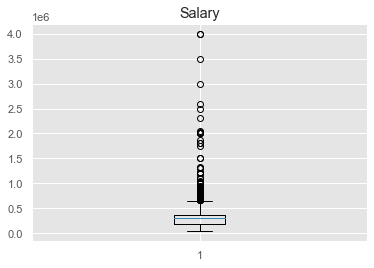

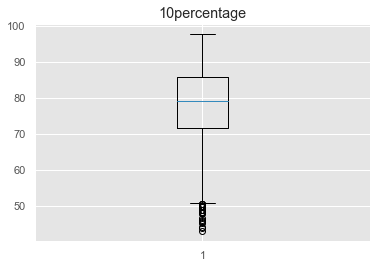

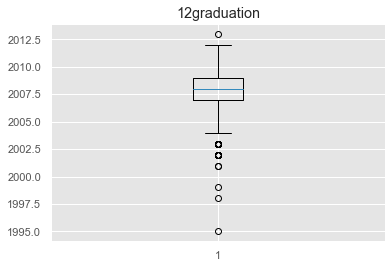

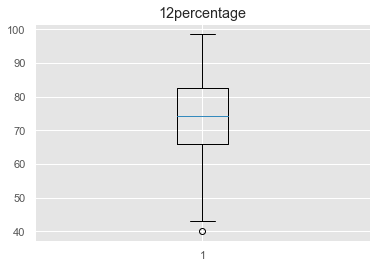

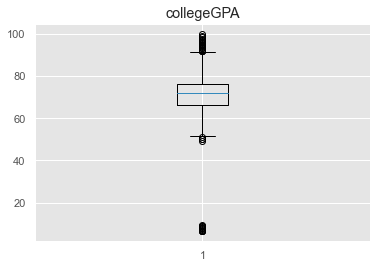

...

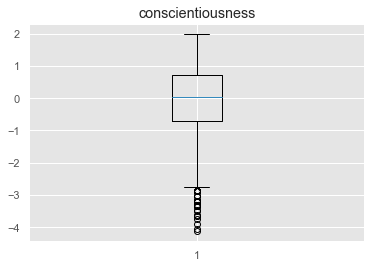

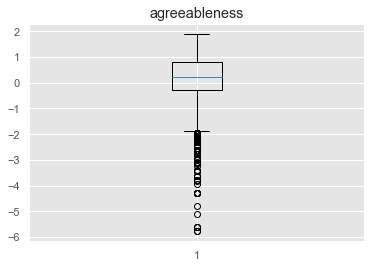

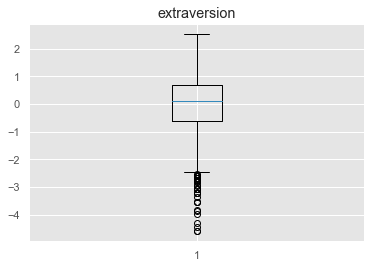

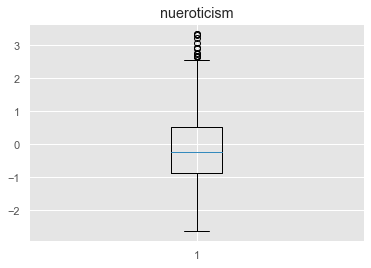

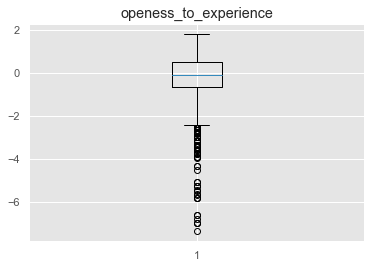

In [9]:



## SALARY
plt.title("Salary")
plt.boxplot(df['Salary'])
plt.show()

## 10percentage
plt.title("10percentage")
plt.boxplot(df['10percentage'])
plt.show()

## 12graduation
plt.title("12graduation")
plt.boxplot(df['12graduation'])
plt.show()


## 12percentage
plt.title("12percentage")
plt.boxplot(df['12percentage'])
plt.show()

## collegeGPA
plt.title("collegeGPA")
plt.boxplot(df['collegeGPA'])
plt.show()

## GraduationYear
plt.title("GraduationYear")
plt.boxplot(df['GraduationYear'])
plt.show()


## English 
plt.title("English")
plt.boxplot(df['English'])
plt.show()

## Logical
plt.title("Logical")
plt.boxplot(df['Logical'])
plt.show()


## Quant
plt.title("Quant")
plt.boxplot(df['Quant'])
plt.show()


## Domain
plt.title("Domain")
plt.boxplot(df['Domain'])
plt.show()


## ComputerProgramming
plt.title("ComputerProgramming")
plt.boxplot(df['ComputerProgramming'])
plt.show()


## ElectronicsAndSemicon
plt.title("ElectronicsAndSemicon")
plt.boxplot(df['ElectronicsAndSemicon'])
plt.show()


## ComputerScience
plt.title("ComputerScience")
plt.boxplot(df['ComputerScience'])
plt.show()


## MechanicalEngg
plt.title("MechanicalEngg")
plt.boxplot(df['MechanicalEngg'])
plt.show()

## ElectricalEngg
plt.title("ElectricalEngg")
plt.boxplot(df['ElectricalEngg'])
plt.show()

## TelecomEngg
plt.title("TelecomEngg")
plt.boxplot(df['TelecomEngg'])
plt.show()


## CivilEngg
plt.title("CivilEngg")
plt.boxplot(df['CivilEngg'])
plt.show()

## conscientiousness 
plt.title("conscientiousness")
plt.boxplot(df['conscientiousness'])
plt.show()

## agreeableness
plt.title("agreeableness")
plt.boxplot(df['agreeableness'])
plt.show()


## extraversion
plt.title("extraversion")
plt.boxplot(df['extraversion'])
plt.show()


## nueroticism
plt.title("nueroticism")
plt.boxplot(df['nueroticism'])
plt.show()

## openess_to_experience
plt.title("openess_to_experience")
plt.boxplot(df['openess_to_experience'])
plt.show()

<AxesSubplot:xlabel='Salary'>

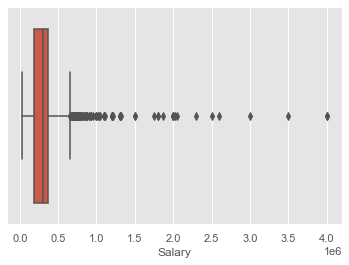

In [10]:

sb.boxplot(x=df['Salary'])


c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

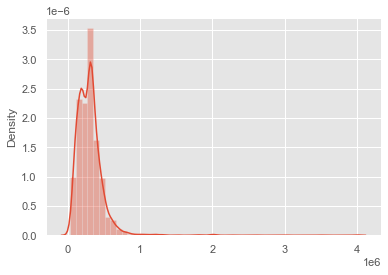

In [11]:
sb.distplot(x=df['Salary'])

<AxesSubplot:xlabel='10percentage'>

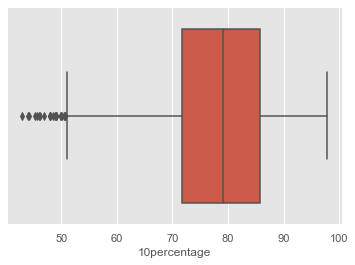

In [12]:
sb.boxplot(x=df['10percentage'])

c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

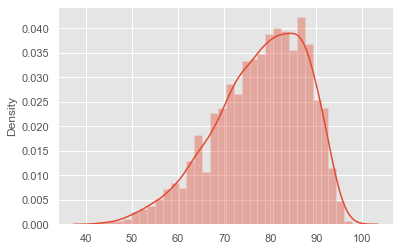

In [13]:
sb.distplot(x=df['10percentage'])

<AxesSubplot:xlabel='12percentage'>

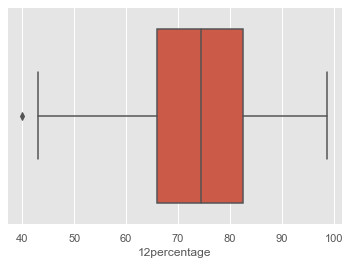

In [14]:
sb.boxplot(x=df['12percentage'])

c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

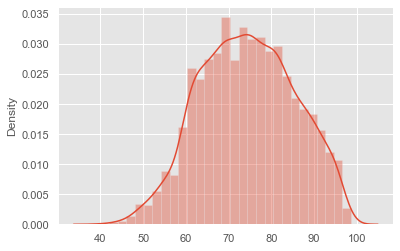

In [15]:
sb.distplot(x=df['12percentage'])

<AxesSubplot:xlabel='collegeGPA'>

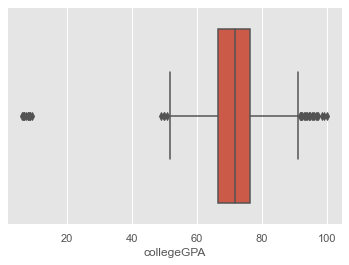

In [16]:
sb.boxplot(x=df['collegeGPA'])

c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:ylabel='Density'>

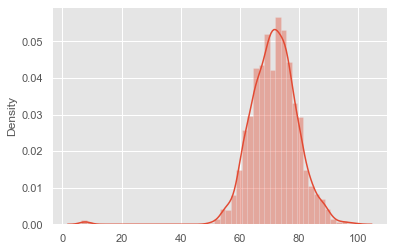

In [17]:
sb.distplot(x=df['collegeGPA'])

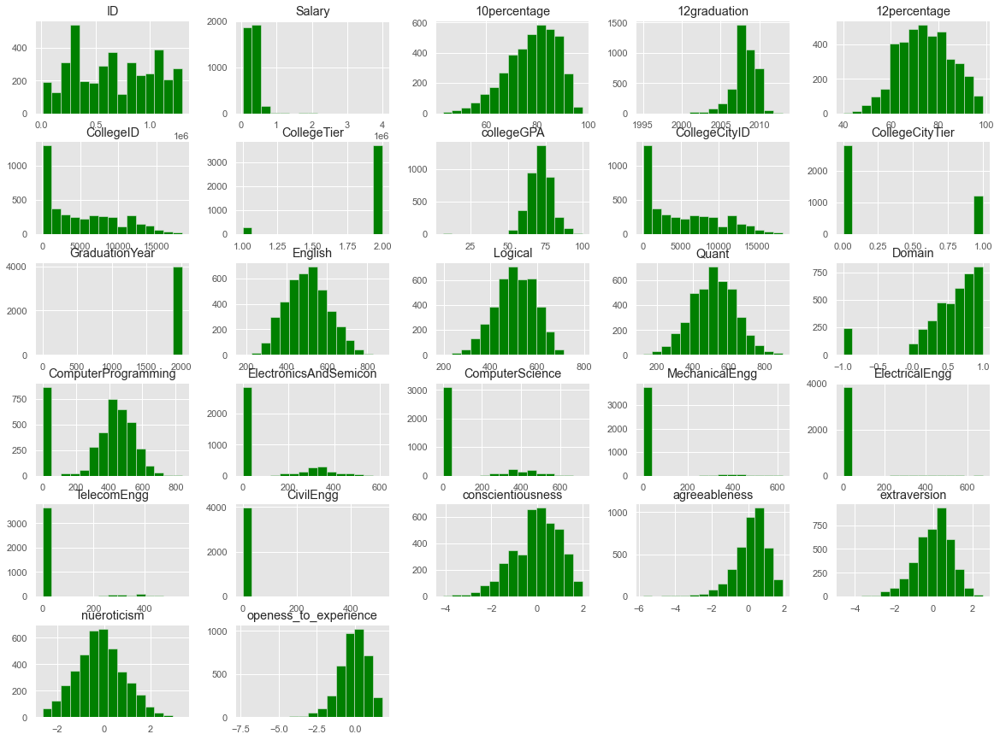

In [18]:
df.hist(bins=15, figsize=(20,15), color = 'green')
plt.show()

### Finding the outliers



<AxesSubplot:xlabel='Salary'>

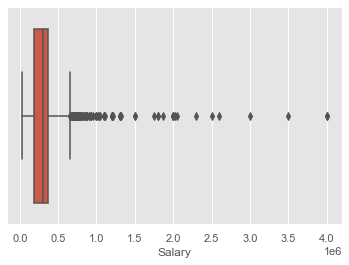

In [19]:
sb.boxplot(x=df['Salary'])

Salary >10,00,000 is very rare, especially in the first job. So these are considered as outliers.

In [20]:
df.set_index("ID" ,inplace=True)
df.head(5)

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,f,19-02-1990 00:00,84.3,"board ofsecondary education,ap",2007,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,m,04-10-1989 00:00,85.4,cbse,2007,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,f,03-08-1992 00:00,85.0,cbse,2010,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
267447,1100000.0,01-07-2011 00:00,present,senior software engineer,Gurgaon,m,05-12-1989 00:00,85.6,cbse,2007,...,-1,-1,-1,-1,-1,0.0464,0.3448,-0.3440,-0.40780,-0.9194
343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,m,27-02-1991 00:00,78.0,cbse,2008,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295


In [21]:
# row in which value of 'salary less than certian amount
for i in range(1,8):
    seriesObj = df.apply(lambda x: True if x['Salary'] <= 250000*i  else False , axis=1)
    # Count number of True in series
    numOfRows = len(seriesObj[seriesObj == True].index)
 
    print('Number of Rows in dataframe in which Salary %d  : '%((250000*i)), numOfRows)


Number of Rows in dataframe in which Salary 250000  :  1710
Number of Rows in dataframe in which Salary 500000  :  3683
Number of Rows in dataframe in which Salary 750000  :  3929
Number of Rows in dataframe in which Salary 1000000  :  3962
Number of Rows in dataframe in which Salary 1250000  :  3975
Number of Rows in dataframe in which Salary 1500000  :  3981
Number of Rows in dataframe in which Salary 1750000  :  3982


In [22]:
indexNames = df[ df['Salary'] > 1000000 ].index
 
# Delete these row indexes from dataFrame
df.drop(indexNames , inplace=True)
df.shape

(3962, 37)

### we removed the outliers for salary

In [23]:
# dropping the CollegeID,CollegeCityID columns because they are unnecessary in our analysis 
df.drop(columns=['CollegeID','CollegeCityID'],axis=1,inplace=True)

In [24]:
df.columns

Index(['Salary', 'DOJ', 'DOL', 'Designation', 'JobCity', 'Gender', 'DOB',
       '10percentage', '10board', '12graduation', '12percentage', '12board',
       'CollegeTier', 'Degree', 'Specialization', 'collegeGPA',
       'CollegeCityTier', 'CollegeState', 'GraduationYear', 'English',
       'Logical', 'Quant', 'Domain', 'ComputerProgramming',
       'ElectronicsAndSemicon', 'ComputerScience', 'MechanicalEngg',
       'ElectricalEngg', 'TelecomEngg', 'CivilEngg', 'conscientiousness',
       'agreeableness', 'extraversion', 'nueroticism',
       'openess_to_experience'],
      dtype='object')

In [25]:
df.reset_index()

,ID,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
0,203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,f,19-02-1990 00:00,84.30,"board ofsecondary education,ap",...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
1,579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,m,04-10-1989 00:00,85.40,cbse,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
2,810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,f,03-08-1992 00:00,85.00,cbse,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
3,343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,m,27-02-1991 00:00,78.00,cbse,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
4,1027655,300000.0,01-06-2014 00:00,present,system engineer,Hyderabad,m,02-07-1992 00:00,89.92,state board,...,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3957,47916,280000.0,01-10-2011 00:00,01-10-2012 00:00,software engineer,New Delhi,m,15-04-1987 00:00,52.09,cbse,...,-1,-1,-1,-1,-1,-0.1082,0.3448,0.2366,0.64980,-0.9194
3958,752781,100000.0,01-07-2013 00:00,01-07-2013 00:00,technical writer,Hyderabad,f,27-08-1992 00:00,90.00,state board,...,-1,-1,-1,-1,-1,-0.3027,0.8784,0.9322,0.77980,-0.0943
3959,355888,320000.0,01-07-2013 00:00,present,associate software engineer,Bangalore,m,03-07-1991 00:00,81.86,"bse,odisha",...,-1,-1,-1,-1,-1,-1.5765,-1.5273,-1.5051,-1.31840,-0.7615
3960,947111,200000.0,01-07-2014 00:00,01-01-2015 00:00,software developer,Asifabadbanglore,f,20-03-1992 00:00,78.72,state board,...,438,-1,-1,-1,-1,-0.1590,0.0459,-0.4511,-0.36120,-0.0943


### Understanding how the salary changes according to the gender in various field.

In [26]:
no_males = df['Gender'].where(df['Gender'] == 'm').count()
no_females = df['Gender'].where(df['Gender'] == 'f').count()
print('Number of male candidates : {}'.format(no_males))
print('Number of female candidates : {}'.format(no_females))
print('Male to Female ratio: {:.2f}'.format(no_males/no_females))

Number of male candidates : 3012
Number of female candidates : 950
Male to Female ratio: 3.17


<AxesSubplot:xlabel='Gender'>

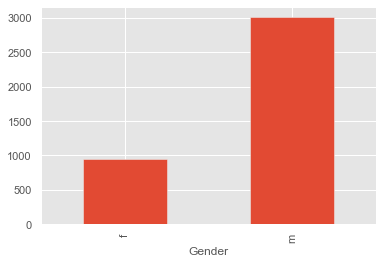

In [27]:
df.groupby('Gender').size().plot(kind='bar')

Text(0.5, 0.98, 'Salary levels by gender')

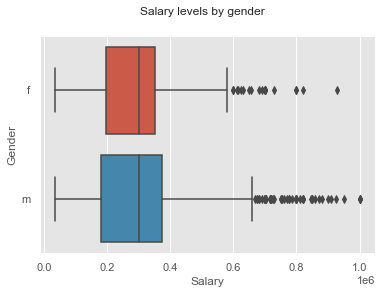

In [28]:
sb.boxplot(x='Salary', y = 'Gender', data=df)
plt.suptitle('Salary levels by gender')

#### mean salary of males is slightly greater than that of females.

(array([511., 953., 923., 974., 352., 136.,  68.,  26.,  12.,   7.]),
 array([  35000.,  131500.,  228000.,  324500.,  421000.,  517500.,
         614000.,  710500.,  807000.,  903500., 1000000.]),
 <BarContainer object of 10 artists>)

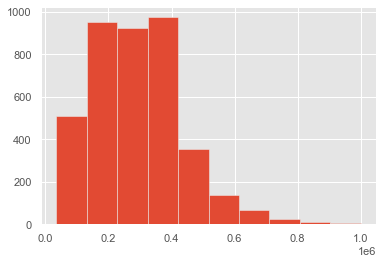

In [29]:
#histogram of salary data
plt.hist(df['Salary'],bins=10)

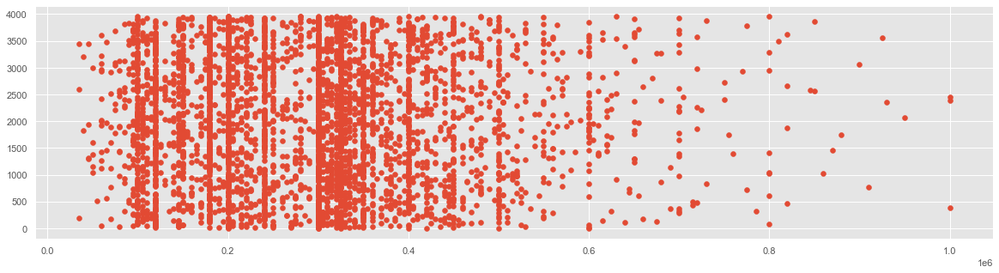

In [30]:
fig, ax = plt.subplots(figsize=(20,5))
ax.scatter(df['Salary'], range(len(df['Salary'])))

In [31]:
salary_men = df.loc[:,:].loc[df['Gender']=='m']['Salary']
salary_females = df.loc[:,:].loc[df['Gender']=='f']['Salary']

<BarContainer object of 2 artists>

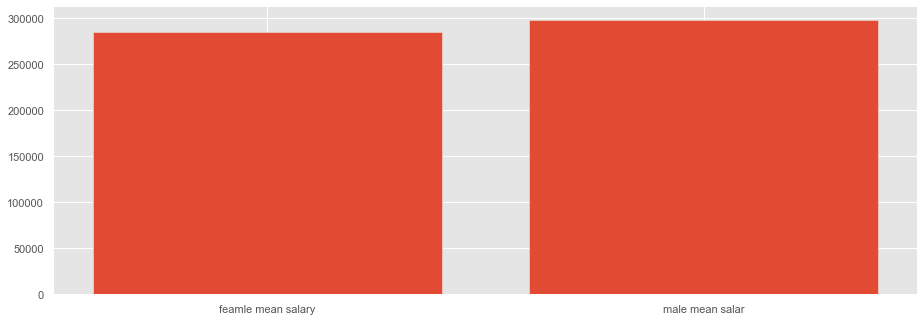

In [32]:
fig = plt.figure()
ax = fig.add_axes([0,0,2,1])
ax.bar(['feamle mean salary','male mean salar'],[salary_females.mean(),salary_men.mean()],)

<AxesSubplot:xlabel='Salary'>

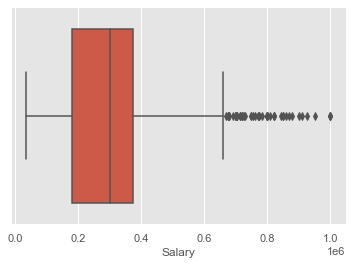

In [33]:
sb.boxplot(x=salary_men)

<AxesSubplot:xlabel='Salary'>

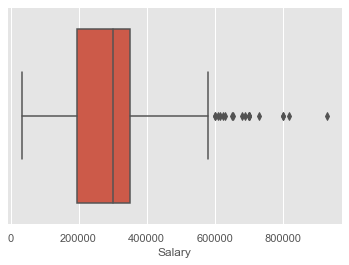

In [34]:
sb.boxplot(x=salary_females)

In [35]:
meanmediandf = pd.DataFrame({
    'male':[salary_men.mean(),salary_men.median()],'female':[salary_females.mean(),salary_females.median()]
}, index=['mean', 'median'])

meanmediandf



,male,female
mean,297484.727756,284252.631579
median,300000.000000,300000.000000


### By doing statistics analysis, we can see that median is equal for both but in mean men_salary is slightly greater than the female_salary.

### Now we will see specialization analysis

<AxesSubplot:>

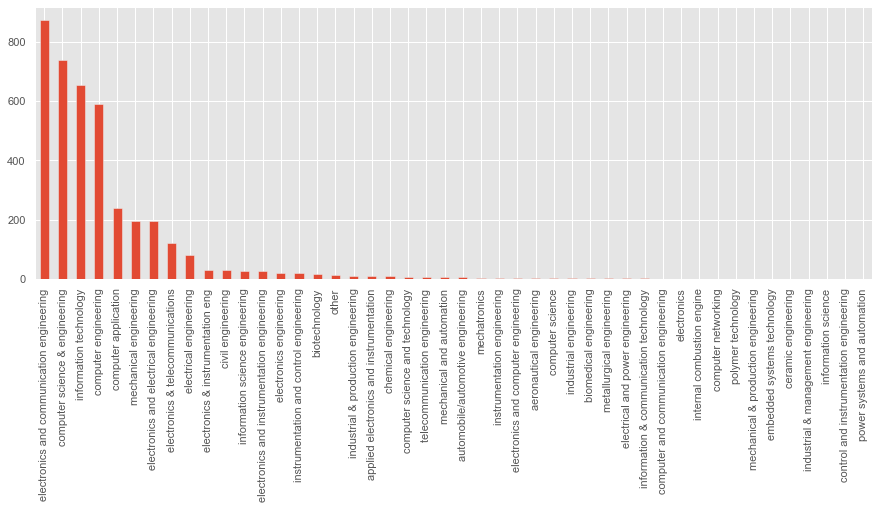

In [36]:
spe_freq = df['Specialization'].value_counts()
spe_freq.plot(kind='bar', figsize=(15,5))

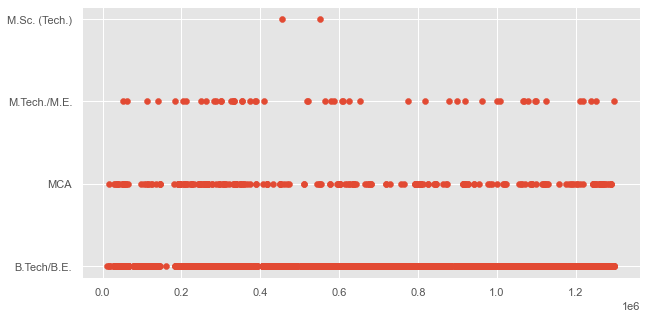

In [37]:
 # Scatter plot of Degree column -
plt.figure(figsize=(10,5))
plt.scatter(df.index, df['Degree'])


<AxesSubplot:xlabel='Degree', ylabel='Salary'>

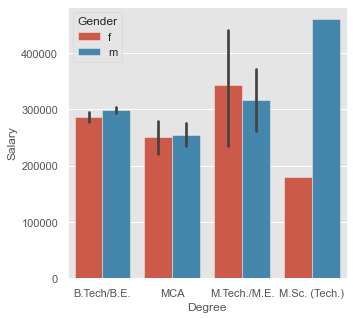

In [38]:
plt.figure(figsize=(5,5))
sb.barplot(x='Degree', y='Salary', data=df, hue='Gender')

In [39]:

specialization_map = \
{'electronics and communication engineering' : 'EC',
 'computer science & engineering' : 'CS',
 'information technology' : 'CS' ,
 'computer engineering' : 'CS',
 'computer application' : 'CS',
 'mechanical engineering' : 'ME',
 'electronics and electrical engineering' : 'EC',
 'electronics & telecommunications' : 'EC',
 'electrical engineering' : 'EL',
 'electronics & instrumentation eng' : 'EC',
 'civil engineering' : 'CE',
 'electronics and instrumentation engineering' : 'EC',
 'information science engineering' : 'CS',
 'instrumentation and control engineering' : 'EC',
 'electronics engineering' : 'EC',
 'biotechnology' : 'other',
 'other' : 'other',
 'industrial & production engineering' : 'other',
 'chemical engineering' : 'other',
 'applied electronics and instrumentation' : 'EC',
 'computer science and technology' : 'CS',
 'telecommunication engineering' : 'EC',
 'mechanical and automation' : 'ME',
 'automobile/automotive engineering' : 'ME',
 'instrumentation engineering' : 'EC',
 'mechatronics' : 'ME',
 'electronics and computer engineering' : 'CS',
 'aeronautical engineering' : 'ME',
 'computer science' : 'CS',
 'metallurgical engineering' : 'other',
 'biomedical engineering' : 'other',
 'industrial engineering' : 'other',
 'information & communication technology' : 'EC',
 'electrical and power engineering' : 'EL',
 'industrial & management engineering' : 'other',
 'computer networking' : 'CS',
 'embedded systems technology' : 'EC',
 'power systems and automation' : 'EL',
 'computer and communication engineering' : 'CS',
 'information science' : 'CS',
 'internal combustion engine' : 'ME',
 'ceramic engineering' : 'other',
 'mechanical & production engineering' : 'ME',
 'control and instrumentation engineering' : 'EC',
 'polymer technology' : 'other',
 'electronics' : 'EC'}

['CS' 'EC' 'ME' 'EL' 'CE' 'other']


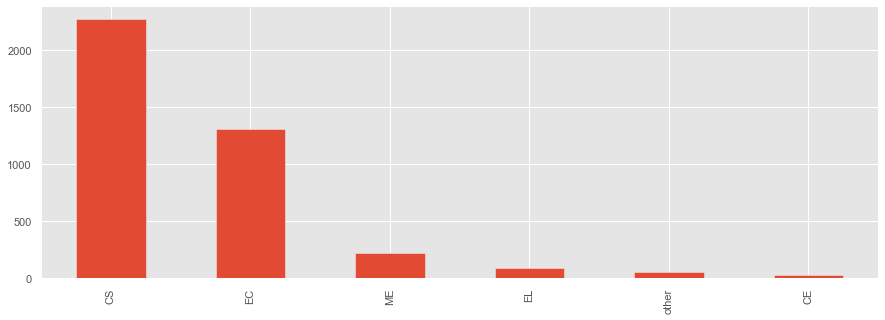

In [40]:

df['Specialization'] = df['Specialization'].map(specialization_map)

df['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))

print(df['Specialization'].unique())

### Bivariate analysis is one of the statistical analysis where two variables are observed. One variable here is dependent while the other is independent. These variables are usually denoted by X and Y. So, here we analyse the changes occured between the two variables and to what extent. Apart from bivariate, there are other two statistical analyses, which are Univariate (for one variable) and Multivariate (for multiple variables).

In [41]:
df.corr()

,Salary,10percentage,12graduation,12percentage,CollegeTier,collegeGPA,CollegeCityTier,GraduationYear,English,Logical,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
Salary,1.000000,0.274463,-0.171369,0.261412,-0.210677,0.192676,0.034107,-0.013938,0.250266,0.243455,...,-0.136872,0.027289,-0.052905,-0.021664,0.066377,-0.064134,0.060564,-0.025842,-0.057979,-0.011443
10percentage,0.274463,1.000000,0.268657,0.642909,-0.119612,0.310853,0.115435,-0.014047,0.347753,0.313364,...,-0.020713,0.056381,0.074845,0.048993,0.030168,0.067968,0.135238,-0.004738,-0.131504,0.036451
12graduation,-0.171369,0.268657,1.000000,0.258391,0.023885,0.088415,-0.003528,0.014002,0.152293,0.108773,...,0.289470,0.039656,0.123696,0.022383,-0.005461,0.103158,0.042380,0.061861,-0.080266,-0.015736
12percentage,0.261412,0.642909,0.258391,1.000000,-0.095467,0.345918,0.128771,-0.013110,0.212230,0.241747,...,-0.045492,0.041199,0.064197,0.044922,0.005892,0.056852,0.102070,-0.007827,-0.093825,0.005164
CollegeTier,-0.210677,-0.119612,0.023885,-0.095467,1.000000,-0.078781,-0.101351,-0.005734,-0.179965,-0.175201,...,0.001542,-0.020902,0.001206,-0.002775,-0.034992,0.057750,-0.033503,0.011262,0.016457,-0.018207
collegeGPA,0.192676,0.310853,0.088415,0.345918,-0.078781,1.000000,0.019564,0.008740,0.103180,0.196229,...,0.008233,-0.030655,0.052963,-0.002905,-0.018880,0.069929,0.066884,-0.031928,-0.072104,0.026841
CollegeCityTier,0.034107,0.115435,-0.003528,0.128771,-0.101351,0.019564,1.000000,0.008239,0.050172,0.018797,...,-0.011217,-0.050674,0.010268,0.051364,-0.033584,0.013176,0.004457,-0.008941,0.005124,-0.018236
GraduationYear,-0.013938,-0.014047,0.014002,-0.013110,-0.005734,0.008740,0.008239,1.000000,-0.024193,-0.024154,...,0.023856,-0.067061,0.008500,0.004292,0.001682,-0.013430,-0.002895,0.008376,-0.000537,0.016947
English,0.250266,0.347753,0.152293,0.212230,-0.179965,0.103180,0.050172,-0.024193,1.000000,0.441710,...,0.062876,0.001263,0.032908,-0.004338,-0.007633,0.033940,0.191989,0.019291,-0.153243,0.067468
Logical,0.243455,0.313364,0.108773,0.241747,-0.175201,0.196229,0.018797,-0.024154,0.441710,1.000000,...,0.046306,-0.008306,0.012436,-0.010851,-0.011191,0.026269,0.164581,-0.009344,-0.176974,0.046459


(array([ 40.,  50.,  60.,  70.,  80.,  90., 100.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

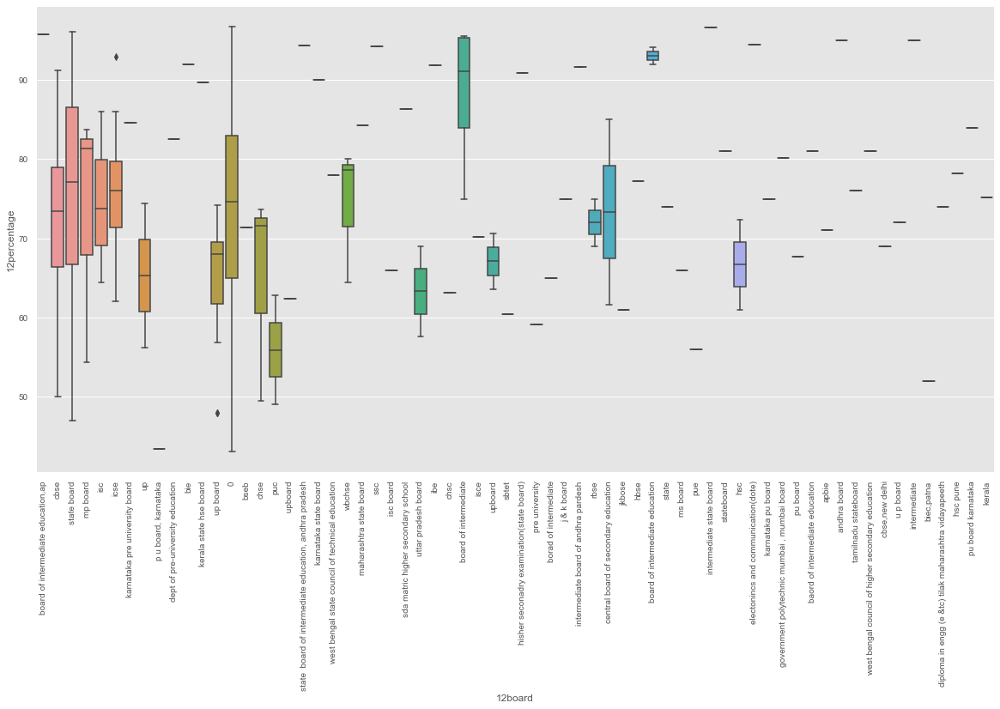

In [42]:
# Boxplot for two variables - One numerical, One categorical -
plt.figure(figsize=(20,10))
sb.boxplot(data = df[:500], x='12board', y='12percentage')
plt.xticks(fontsize=10)
plt.xticks(rotation=90)
plt.yticks(fontsize=10)


Text(0, 0.5, 'Salary')

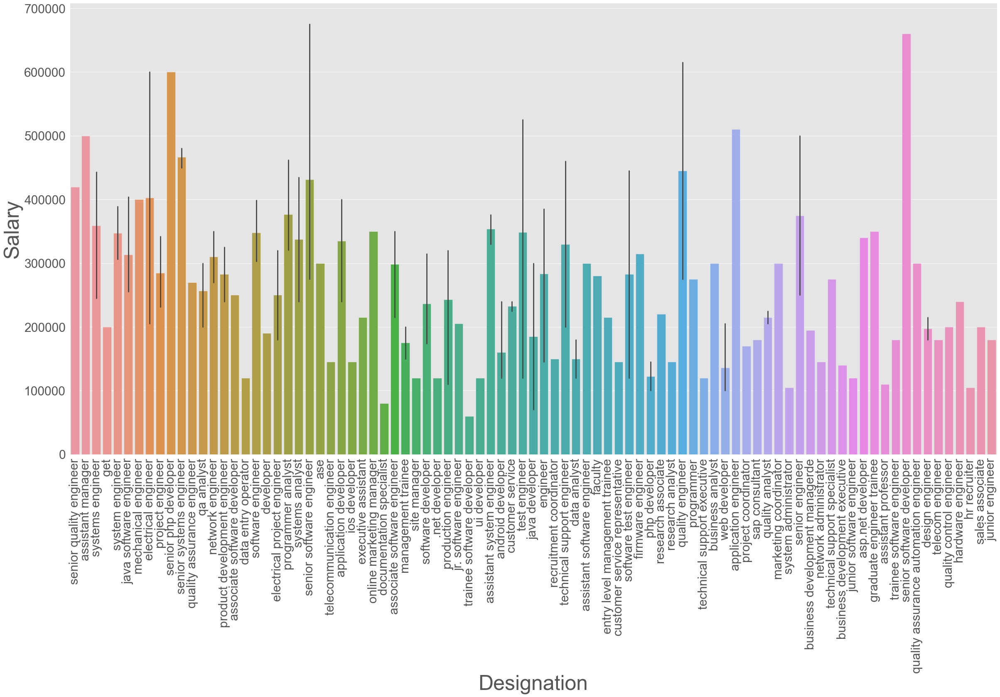

In [43]:
 # Designation by Salary -
plt.figure(figsize=(40, 20))
data1 = df.sort_values(by=['Salary'], ascending=False)
sb.barplot(x='Designation', y='Salary', data=df[:200])
plt.xticks(fontsize=30)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Designation', fontsize= 50)
plt.ylabel('Salary', fontsize = 50)


c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 89.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 84.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 44.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\users\pulkit\appdata\local\programs\python\python38-32\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 14.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warn

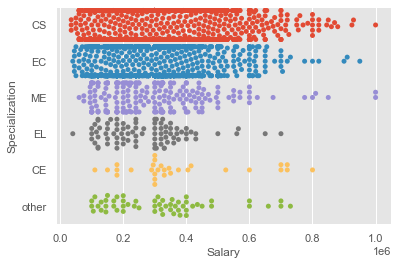

In [44]:
ax = sb.swarmplot(x="Salary", y="Specialization", data=df)

### Heatmap:-- A heat map is a two-dimensional representation of data in which values are represented by colors. A simple heat map provides an immediate visual summary of information. More elaborate heat maps allow the viewer to understand complex data sets.

<AxesSubplot:>

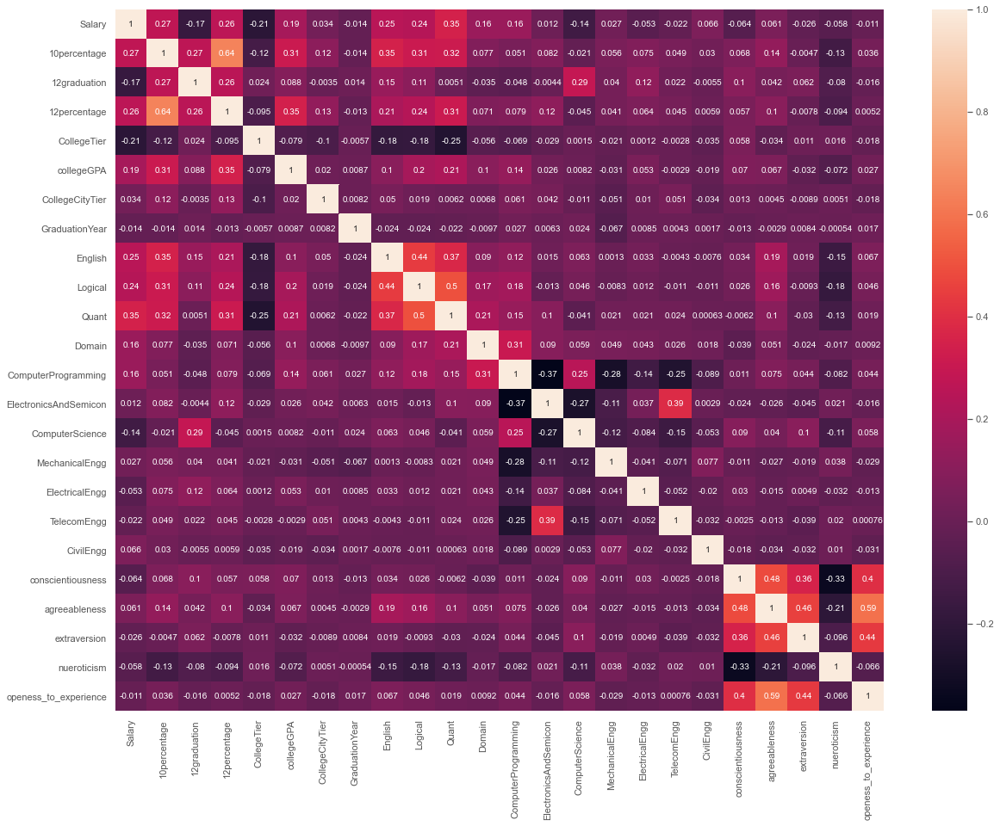

In [45]:
plt.subplots(figsize=(20,15))
sb.heatmap(df.corr(method='pearson'), annot = True)

## TIMES OF INDIA RESEARCH QUESTION

Times of India article dated Jan 18, 2019 states that “After doing your Computer Science Engineering if you take up jobs as a Programming Analyst, Software Engineer, Hardware Engineer and Associate Engineer you can earn up to 2.5-3 lakhs as a fresh graduate.” Test this claim with the data given to you.

Is there a relationship between gender and specialisation? (i.e. Does the preference of Specialisation depend on the Gender?)

## AVERAGE SALARY OF CS FRESH GRADUATE

In [46]:
df.loc[:,:].loc[df['Specialization']=='CS']['Salary'].mean()

297323.6331569665

In [47]:
df.loc[:,:].loc[df['Specialization']=='CS']['Salary'].median()

300000.0

### Yes the claim of TIMES OF INDIA RESEARCH QUESTION is right the average or mean and package of CS graduate is between 2.5 - 3 lakh that is 297323.63 (almost 3 lakh).

### And,the median value of CS graduate is also 3 lakh.

### Is there a relationship between gender and specialisation?????.. Let's see

Text(0.5, 1.0, 'total male student specialization')

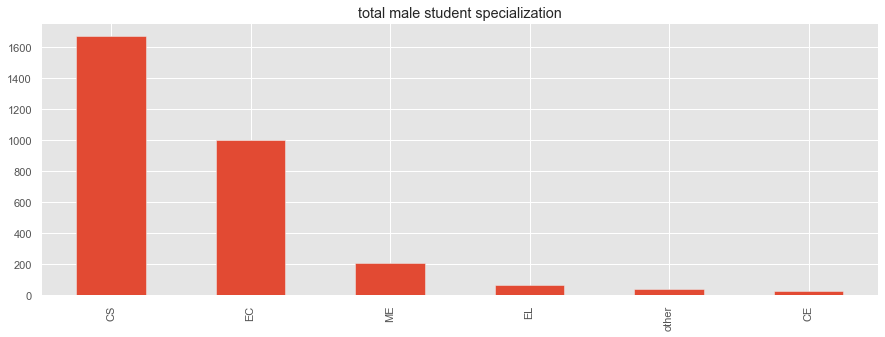

In [48]:
df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))
plt.title('total male student specialization')

Text(0.5, 1.0, 'total female student specialization')

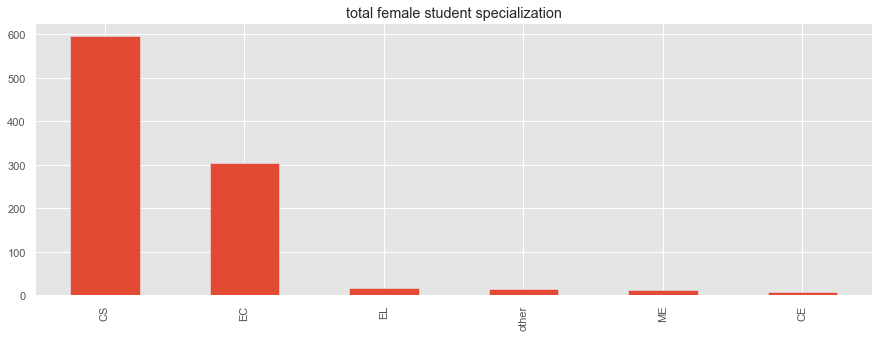

In [49]:
df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts().plot(kind='bar', figsize=(15,5))
plt.title('total female student specialization')

<AxesSubplot:xlabel='Gender', ylabel='Salary'>

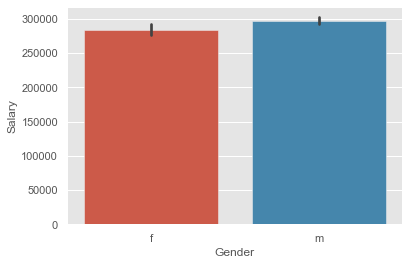

In [50]:
sb.barplot(x='Gender', y='Salary', data=df)


In [51]:
df.Gender.value_counts()

m    3012
f     950
Name: Gender, dtype: int64

Text(0.5, 0, 'Specialization')

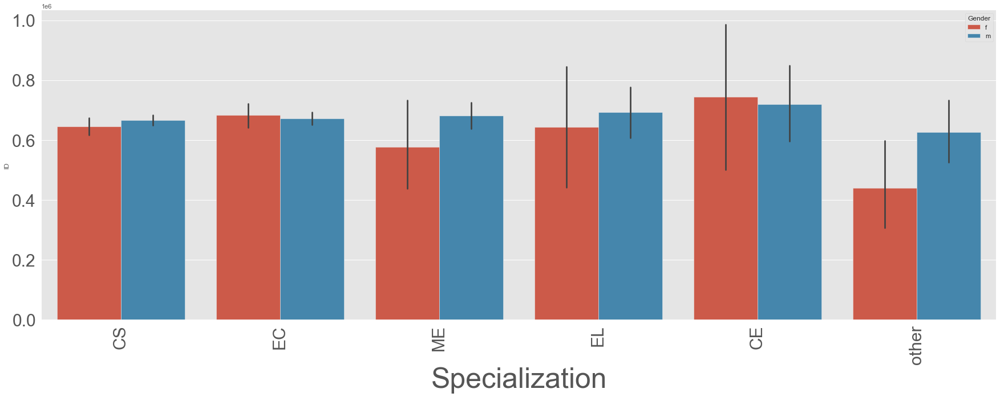

In [52]:
plt.figure(figsize=(30, 10))
sb.barplot(x='Specialization', y=df.index, data=df, hue='Gender')
plt.xticks(fontsize=30)
plt.xticks(rotation=90)
plt.yticks(fontsize=30)
plt.xlabel('Specialization', fontsize= 50)

### RATIO OF MALE FEMALE DATA

In [53]:
len(df.loc[:,:].loc[df['Gender']=='m'])/len(df.loc[:,:].loc[df['Gender']=='f'])

3.170526315789474

As there is 3 times more male data than female data so we have to check the ratio of no of student in all the specialization.

In [54]:
(df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts()/df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts())

CE        3.833333
CS        2.805369
EC        3.291803
EL        4.250000
ME       17.000000
other     2.733333
Name: Specialization, dtype: float64

Text(0.5, 1.0, 'Ratio of male/ femele students in per specialization')

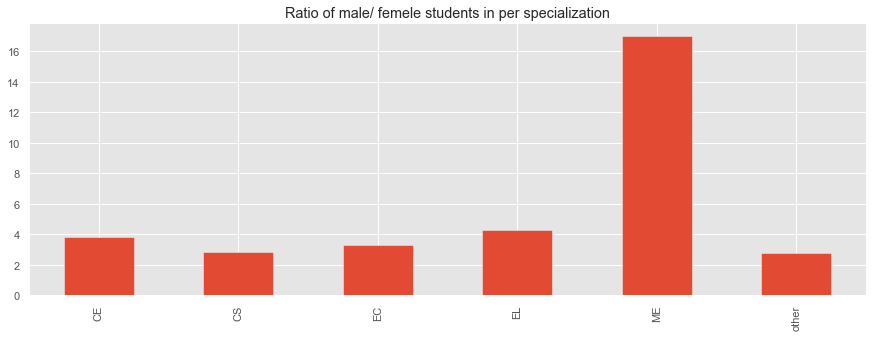

In [55]:
(df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts()/df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts()).plot(kind='bar', figsize=(15,5))
plt.title("Ratio of male/ femele students in per specialization")

In [56]:
pd.DataFrame(df.loc[:,:].loc[df['Gender']=='m']['Specialization'].value_counts()/df.loc[:,:].loc[df['Gender']=='f']['Specialization'].value_counts())

,Specialization
CE,3.833333
CS,2.805369
EC,3.291803
EL,4.250000
ME,17.000000
other,2.733333


## here we observe that the specialization is depends on gender, as we can see in mechanical engineering there is 3:1 ratio i.e. male students prefer meachanical engineering than the female students but while in computer engineering we observe that ratio is less than 3:1 i.e. female students prefer computer engineering than the male students

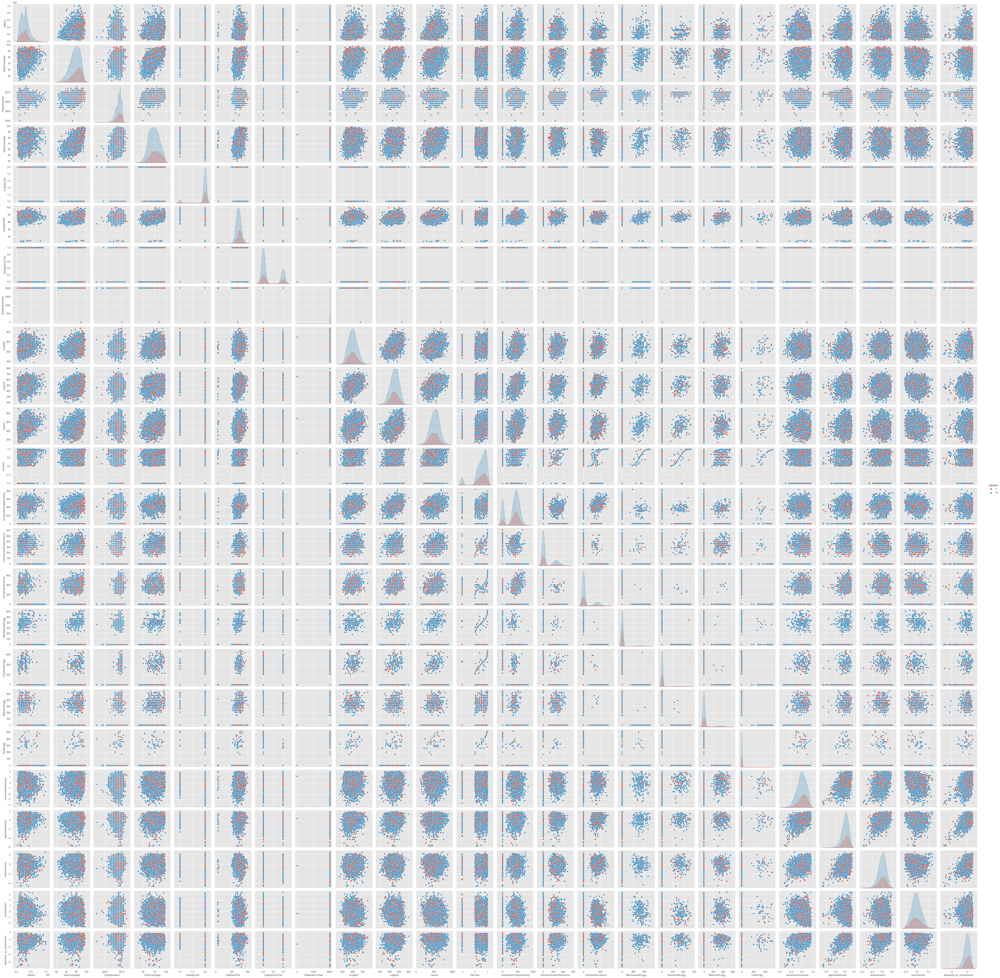

In [57]:
sb.pairplot(df , hue = 'Gender')

## Standardization:--


Standardization is another scaling technique where the values are centered around the mean with a unit standard deviation. This means that the mean of the attribute becomes zero and the resultant distribution has a unit standard deviation


formula for standardization:

 $$ X^{\prime}=\frac{X-\mu}{\sigma} $$
 
Mu is the mean of the feature values and Sigma is the standard deviation of the feature values. Note that in this case, the values are not restricted to a particular range.

In [58]:
standard_10percentage = preprocessing.scale(df['10percentage'])
print(standard_10percentage)


[ 0.64795392  0.759782    0.71911725 ...  0.39989892  0.08068059
 -0.74481394]


In [59]:
standard_12percentage = preprocessing.scale(df['12percentage'])
print(standard_12percentage)


[ 1.93866587  0.9570119  -0.57000538 ... -0.81541887 -0.41730365
 -0.58818415]


In [60]:
standard_collegeGPA = preprocessing.scale(df['collegeGPA'])
print(standard_collegeGPA)


[ 0.80079831 -0.17306075 -0.18041989 ... -0.18041989 -0.12890593
 -0.42572443]


### Label Encoding -

Label encoding is used to transform categorical data into numerical data.

For categorical features - If we have 2 categories than we can convert into binary. If we have more than 2
categories we can use dummy variables.


In [61]:
 # For two values -
encoding_gender = preprocessing.OneHotEncoder(sparse=False)
df['Gender'] = encoding_gender.fit_transform(df[['Gender']])

In [62]:
df.head()

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,1.0,19-02-1990 00:00,84.30,"board ofsecondary education,ap",2007,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,0.0,04-10-1989 00:00,85.40,cbse,2007,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,1.0,03-08-1992 00:00,85.00,cbse,2010,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,0.0,27-02-1991 00:00,78.00,cbse,2008,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
1027655,300000.0,01-06-2014 00:00,present,system engineer,Hyderabad,0.0,02-07-1992 00:00,89.92,state board,2010,...,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608


In [63]:
# For more than two values -
encoding_degree = preprocessing.OrdinalEncoder()
df['Degree'] = encoding_degree.fit_transform(df[['Degree']])

In [64]:
df.head()

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,01-06-2012 00:00,present,senior quality engineer,Bangalore,1.0,19-02-1990 00:00,84.30,"board ofsecondary education,ap",2007,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
579905,500000.0,01-09-2013 00:00,present,assistant manager,Indore,0.0,04-10-1989 00:00,85.40,cbse,2007,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
810601,325000.0,01-06-2014 00:00,present,systems engineer,Chennai,1.0,03-08-1992 00:00,85.00,cbse,2010,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,get,Manesar,0.0,27-02-1991 00:00,78.00,cbse,2008,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
1027655,300000.0,01-06-2014 00:00,present,system engineer,Hyderabad,0.0,02-07-1992 00:00,89.92,state board,2010,...,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608


In [65]:
# For more than two values -
encoding_Designation = preprocessing.OrdinalEncoder()
df['Designation'] = encoding_Designation.fit_transform(df[['Designation']])

In [66]:
df.head()

,Salary,DOJ,DOL,Designation,JobCity,Gender,DOB,10percentage,10board,12graduation,...,ComputerScience,MechanicalEngg,ElectricalEngg,TelecomEngg,CivilEngg,conscientiousness,agreeableness,extraversion,nueroticism,openess_to_experience
ID,,,,,,,,,,,,,,,,,,,,,
203097,420000.0,01-06-2012 00:00,present,315.0,Bangalore,1.0,19-02-1990 00:00,84.30,"board ofsecondary education,ap",2007,...,-1,-1,-1,-1,-1,0.9737,0.8128,0.5269,1.35490,-0.4455
579905,500000.0,01-09-2013 00:00,present,17.0,Indore,0.0,04-10-1989 00:00,85.40,cbse,2007,...,-1,-1,-1,-1,-1,-0.7335,0.3789,1.2396,-0.10760,0.8637
810601,325000.0,01-06-2014 00:00,present,375.0,Chennai,1.0,03-08-1992 00:00,85.00,cbse,2010,...,-1,-1,-1,-1,-1,0.2718,1.7109,0.1637,-0.86820,0.6721
343523,200000.0,01-03-2014 00:00,01-03-2015 00:00,133.0,Manesar,0.0,27-02-1991 00:00,78.00,cbse,2008,...,-1,-1,-1,-1,-1,-0.8810,-0.2793,-1.0697,0.09163,-0.1295
1027655,300000.0,01-06-2014 00:00,present,371.0,Hyderabad,0.0,02-07-1992 00:00,89.92,state board,2010,...,407,-1,-1,-1,-1,-0.3027,-0.6201,-2.2954,-0.74150,-0.8608


### -------------------------------------------------------------------THANK YOU----------------------------------------------------------------------------